In [ ]:
import numpy as np
import cv2
import os
from google.colab.patches import cv2_imshow

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


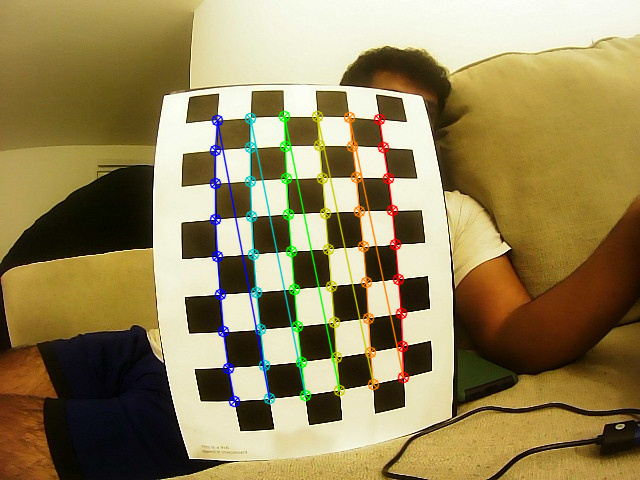

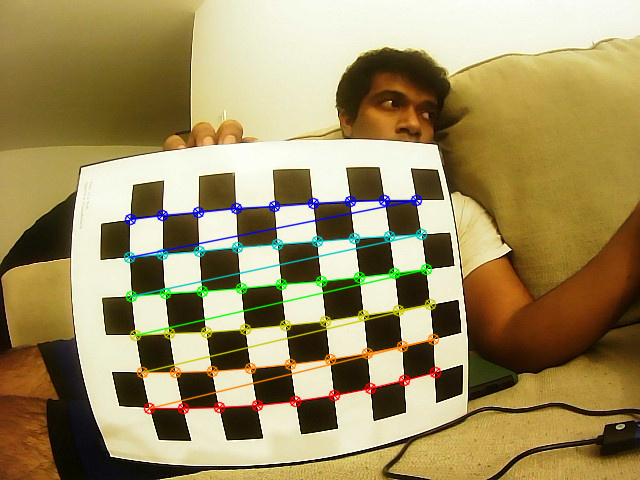

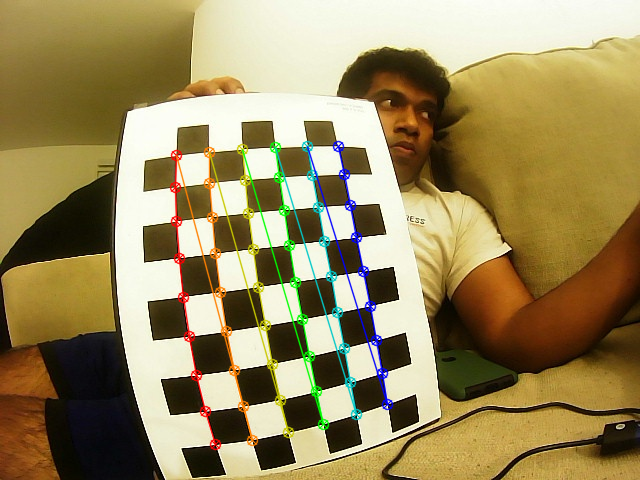

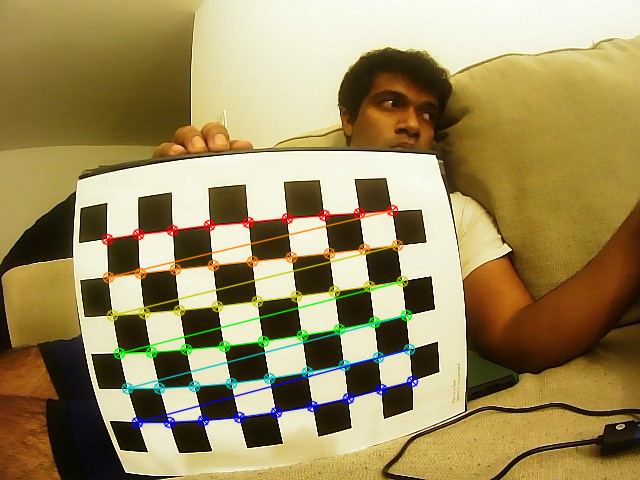

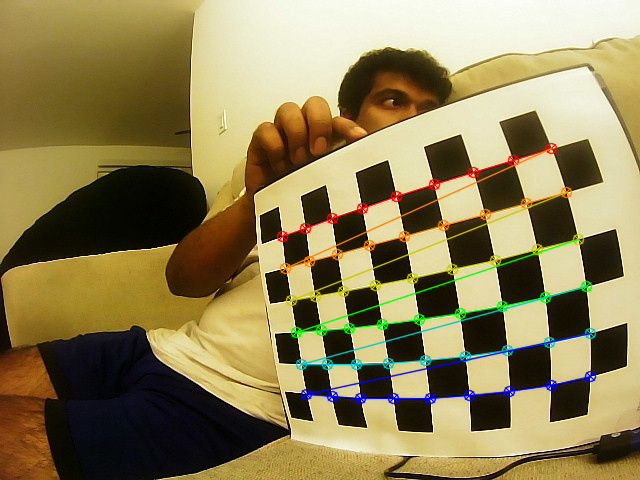

...

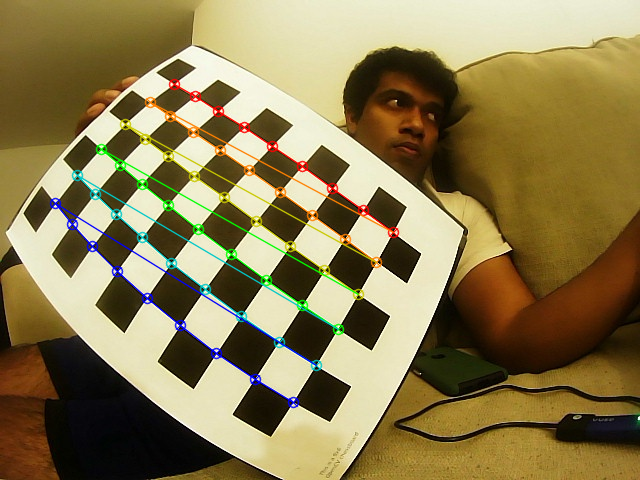

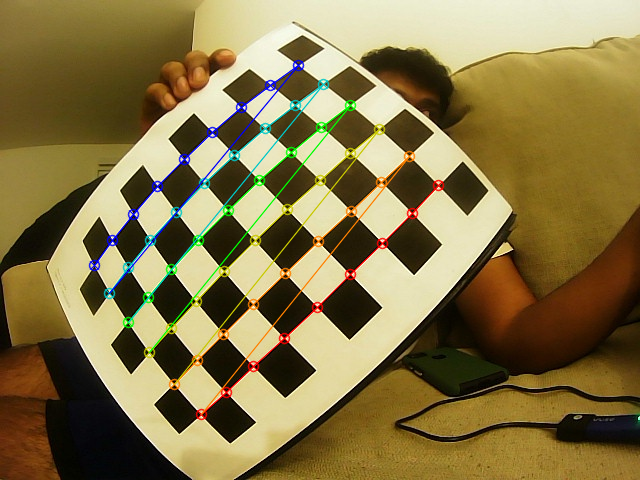

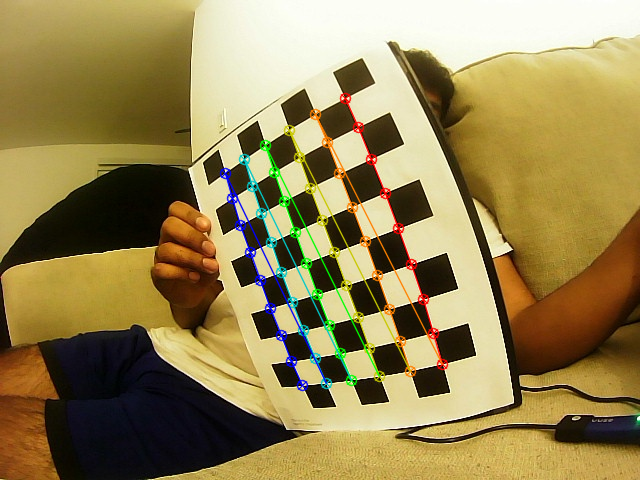

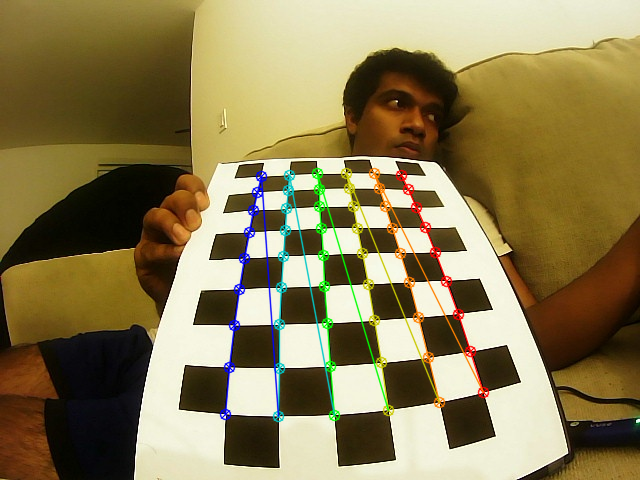

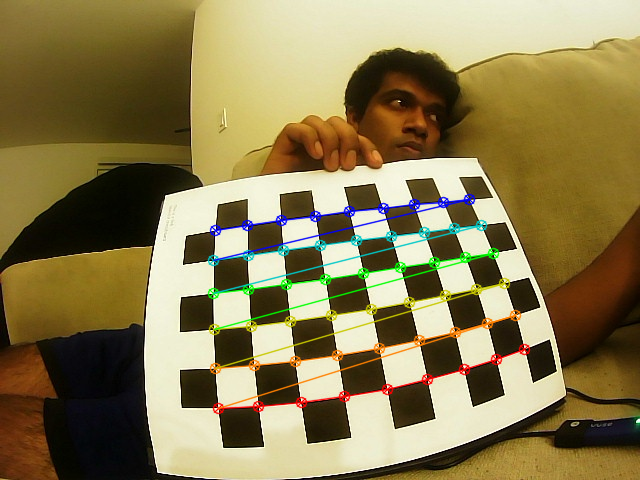

In [ ]:
#termination criteria
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 25, 0.001)

# prepare object points
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays ot store object points and image points from all the world images
objpoints = []
imgpoints = []
imgdir = "/content/drive/MyDrive/SLAM_Recording/calib/"
images = os.listdir(imgdir)

for fname in images:
    img = cv2.imread(imgdir + fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # find the corners
    ret,corners = cv2.findChessboardCorners(gray,(9,6),None)

    # If found, add object points, image points
    if ret:
        objpoints.append(objp)
        cv2.cornerSubPix(gray,corners,(11,11),(-1,-1),criteria)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img,(9,6),corners,ret)
        cv2_imshow(img)
        cv2.waitKey(500)

    cv2.destroyAllWindows()
    

In [9]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None,None)
print(mtx)
print(dist)
""" 
fx = 311.67397945
cx = 331.50806364
fy = 312.89757496
cy = 251.33979258

k1 = -3.19984099e-01
k2 = 1.03548807e-01
p1 = -1.95343099e-05
p2 = 1.58072016e-04
k3 = -1.45622365e-02
"""

[[311.67397945   0.         331.50806364]
 [  0.         312.89757496 251.33979258]
 [  0.           0.           1.        ]]
[[-3.19984099e-01  1.03548807e-01 -1.95343099e-05  1.58072016e-04
  -1.45622365e-02]]
